# Convolutional Autoencoder

Sticking with the MNIST dataset, let's improve our autoencoder's performance using convolutional layers. Again, loading modules and the data.

In [1]:
%matplotlib inline

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
import os 
import matplotlib.pyplot as plt
from matplotlib.image import imread
from scipy.misc import imsave
from scipy.misc import imresize
import numpy as np
from numpy import genfromtxt
import tensorflow as tf
from PIL import Image
import pickle
# from tensorflow_vgg import vgg16|
import collections
import time
import math

# Import GEI dataset 

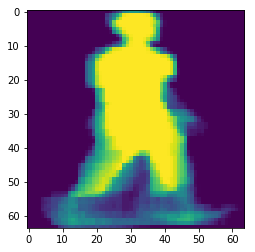

In [34]:
img = imread('{}'.format(os.path.join('OULP-C1V2_Pack/GEI/OULP-GEI-(224x224)-15f/Seq00/0000024', '0000024_55_GEI_15f.png')))
img = imresize(img, [64, 64], interp='nearest')
plt.imshow(img)
plt.show()

In [45]:
# Create Training Data
path = 'OULP-C1V2_Pack/GEI/OULP-GEI-(224x224)/Seq01'
Seq_15f_list = os.listdir(path)
Seq_15f_list.remove('.DS_Store')

Seq = []
for each_seq in Seq_15f_list:
    seq_path = os.path.join(path, each_seq)
    GEI = []
    for each_GEI in os.listdir(seq_path):
        img = imread('{}'.format(os.path.join(seq_path, each_GEI)))
        img = imresize(img, [64, 64], interp='nearest')
        GEI.append(img)
    Seq.append(np.array(GEI))
Seq = np.array(Seq)

In [46]:
with open('../gait_data/OULP_GEI/codes', 'wb') as f:
    np.save(f, Seq)

# Checkpoint 1

In [2]:
# gallery_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq00', mode='rb'))
# probe_15f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_15f_Seq01', mode='rb'))
gallery_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq00', mode='rb'))
probe_full = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_full_Seq01', mode='rb'))

In [3]:
gallery_full = gallery_full/float(255)
probe_full = probe_full/float(255)

<br><br><br><br><br><br><br><br><br>

# Auto_Encoder 1: 55''-65''
### 先试full-full

In [4]:
# Train X
train_x = np.concatenate([gallery_full[:2800, 0], probe_full[:2800, 0]], axis=0)
train_x = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
# Train Y
train_y = np.concatenate([gallery_full[:2800, 1], probe_full[:2800, 1]], axis=0)
train_y = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
print('train_x', train_x.shape, 'train_y', train_y.shape)

# Val X
val_x = gallery_full[2800:, 0]
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = gallery_full[2800:, 1]
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = probe_full[2800:, 0]
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = probe_full[2800:, 1]
test_y = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

train_x (5600, 64, 64, 1) train_y (5600, 64, 64, 1)
val_x (346, 64, 64, 1) val_y (346, 64, 64, 1)
test_x (346, 64, 64, 1) test_y (346, 64, 64, 1)


# Create Graph

In [5]:
def build_inputs_outputs():
    inputs_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='inputs_1')
    targets_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='targets_1')
    
    return inputs_1, targets_1

def conv_layer(inputs_, conv_name, pool_name, bn_name, relu_name, add_bacth_norm=True, is_training=True, out_dim=1, 
               kern_size=(2,2), conv_strides=(1,1), pool_size=(2,2), pool_strides=(2,2), keep_prob=0.5):
    ### Encoder
    # e.g. out_dim: 8; kern_size: (3,3); pool_size: (2,2); strides: (2,2);
    conv = tf.layers.conv2d(inputs_, out_dim, kern_size, strides=conv_strides, padding='same', activation=None,
                            name=conv_name)
    # Now 28x28x
    if add_bacth_norm:
        conv = tf.layers.batch_normalization(conv, training=is_training, name=bn_name)
        
    conv = tf.nn.relu(conv, name=relu_name)
        
    maxpool = tf.layers.max_pooling2d(conv, pool_size, pool_strides, padding='same', name=pool_name)
    
    maxpool = tf.layers.dropout(maxpool, rate=keep_prob)

    return maxpool

#     # Now 14x14x16
#     conv2 = tf.layers.conv2d(maxpool1, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
#     # Now 7x7x8
#     conv3 = tf.layers.conv2d(maxpool2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 7x7x8
#     encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
#     # Now 4x4x8

def deconv_layer(encoded, up_name, conv_name, bn_name, relu_name, add_batch_norm=True, is_training=True, 
                 up_size=(2,2), out_dim=1, kern_size=(2,2), conv_strides=(1,1), keep_prob=0.5):
    ### Decoder
    upsample = tf.image.resize_nearest_neighbor(encoded, up_size, name=up_name) # up_size: e.g.(7,7)
    # Now 7x7x8 kern_size: (3, 3)
    conv = tf.layers.conv2d(upsample, out_dim, kern_size, strides=conv_strides, padding='same', activation=None, 
                            name=conv_name) 
    
    if add_batch_norm:
        conv = tf.layers.batch_normalization(conv, training=is_training, name=bn_name)
    
    conv = tf.nn.relu(conv, name=relu_name)
    
    conv = tf.layers.dropout(conv, rate=keep_prob)
    
    return conv

#     # Now 7x7x8
#     upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
#     # Now 14x14x8
#     conv5 = tf.layers.conv2d(upsample2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
#     # Now 28x28x8
#     conv6 = tf.layers.conv2d(upsample3, 16, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 28x28x16

def output_layer(conv, logits_name, bn_name, decoded_name, add_batch_norm=True, is_training=True, 
                 out_dim=1, kern_size=(3,3), conv_strides=(1,1)):
    logits = tf.layers.conv2d(conv, out_dim, kern_size, strides=conv_strides, padding='same', activation=None, 
                              name=logits_name)
    
    if add_batch_norm:
        conv = tf.layers.batch_normalization(conv, training=is_training, name=bn_name)
    #Now 28x28x1
    decoded = tf.nn.sigmoid(logits, name=decoded_name)
    
    return logits, decoded

In [6]:
def build_graph(kern_size, conv_strides, pool_size, pool_strides, de_kern_size, 
                de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)], is_training=True):
    
    # reset graph
    tf.reset_default_graph()
    
    with tf.name_scope('inputs_targets'):
        inputs_1, targets_1 = build_inputs_outputs()
    
    keep_p = tf.placeholder(tf.float32, name="keep_prob")
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    with tf.name_scope('conv_layers'):
        
        maxpool_1 = conv_layer(inputs_1, 'conv_1', 'pool_1', 'bn_1', 'relu_1', add_bacth_norm=False, 
                               is_training=is_training, out_dim=16, kern_size=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_2 = conv_layer(maxpool_1, 'conv_2', 'pool_2', 'bn_2', 'relu_2', add_bacth_norm=True, 
                               is_training=is_training, out_dim=8, kern_size=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_3 = conv_layer(maxpool_2, 'conv_3', 'pool_3', 'bn_3', 'relu_3', add_bacth_norm=True, 
                               is_training=is_training, out_dim=8, kern_size=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
    with tf.name_scope('deconv_layers'):
        
        deconv_1 = deconv_layer(maxpool_3, 'up_1', 'deconv_1', 'de_bn_1', 'de_relu_1', add_batch_norm=True, 
                              is_training=is_training, up_size=up_size[0], out_dim=8, kern_size=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_2 = deconv_layer(deconv_1, 'up_2', 'deconv_2', 'de_bn_2', 'de_relu_2', add_batch_norm=True, 
                              is_training=is_training, up_size=up_size[1], out_dim=8, kern_size=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_3 = deconv_layer(deconv_2, 'up_3', 'deconv_3', 'de_bn_3', 'de_relu_3', add_batch_norm=True, 
                              is_training=is_training, up_size=up_size[2], out_dim=16, kern_size=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
    with tf.name_scope('output_layer'):
        
        logits, decoded = output_layer(deconv_3, 'logits', 'bn', 'decoded', add_batch_norm=True, is_training=is_training, 
                                       out_dim=1, kern_size=out_kern_size, conv_strides=out_strides)
        
    loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_1, logits=logits, name='loss')
    cost = tf.reduce_mean(loss, name='cost')
    opt = tf.train.AdamOptimizer(learning_rate).minimize(cost)
    
    with tf.name_scope('saver'):
        saver = tf.train.Saver()
        
#     merged = tf.summary.merge_all()
    
    export_nodes = ['inputs_1', 'targets_1', 'maxpool_1', 'maxpool_2', 'maxpool_3', 'deconv_1', 'deconv_2', 
                    'deconv_3', 'logits', 'decoded', 'loss', 'cost', 'opt', 'saver', 'learning_rate', 'keep_p']
    
    Graph = collections.namedtuple('Graph', export_nodes)
    local_dict = locals()
    graph = Graph(*[local_dict[each] for each in export_nodes])
    
    return graph

In [7]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.1)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

In [8]:
error = np.random.rand(10,5,5,1)
np.sum(error >= 0.9)/100

0.28000000000000003

In [9]:
def train(model, epochs, save_string):

    with tf.Session(config=tf.ConfigProto(log_device_placement=True)) as sess:
        sess.run(tf.global_variables_initializer())
        
        iteration = 1
        mean_val_loss = 0
        mean_val_acc = 0
        count_loss_not_decrease_epochs = 0
        count_acc_not_decrease_epochs = 0
        Last_val_loss = 0
        Last_val_acc = 0
        
        
        for e in range(epochs):
            for train_batch, target_batch in get_batches(train_x, train_y, batch_size):
                    
                start = time.time()
                
                feed_1 = {
                        model.inputs_1: train_batch, 
                        model.targets_1: target_batch,
                        model.keep_p: 0.5,
                        model.learning_rate: lr
                        }

                train_loss, _, decoded_img = sess.run([model.cost, model.opt, model.decoded], feed_dict=feed_1)
                
                train_acc = cal_accuracy(decoded_img, target_batch)
                
                if iteration%25==0:
                    end = time.time()
#                     acc = calculate_accuracy(sess, pred, target_batch, sq_length)
                    print(
                          "Epoch: {}/{},".format(e+1, epochs),' ',
                          "Iteration: {},".format(iteration),' ',
                          "Train loss: {:.3f},".format(train_loss),' '
                          "{:.1f}s /batch.".format((end-start)/5),' '
                          "Train Accuracy: %{:.3f}".format(train_acc) 
                    )
                                
                ##############################################################
                ######################## VALIDATION ##########################
                ##############################################################
                
                if iteration%75==0:
#                     training = True
                    validation_loss = []
                    validation_acc = []
                    
                    if batch_size >= len(val_x):
                        val_batch_size = len(val_x)
                    else: 
                        val_batch_size = batch_size
                        

                    for ii, (val_batch, val_target_batch) in enumerate(get_batches(val_x, val_y, val_batch_size)):
#                         print(ii, len(val_x)//val_batch_size)
                        feed_2 = {
                                model.inputs_1: val_batch,
                                model.targets_1: val_target_batch,
                                model.keep_p: 1
                                }
                        
                        val_loss, val_decoded_img, max_pool_3 = sess.run([model.cost, model.decoded, model.maxpool_3], 
                                                                          feed_dict=feed_2)

                        val_acc = cal_accuracy(val_decoded_img, val_target_batch)
                        
                        validation_loss.append(val_loss)
                        validation_acc.append(val_acc)
                    
                    Last_val_loss = mean_val_loss
                    Last_val_acc = mean_val_acc
                    mean_val_loss = np.mean(np.array(validation_loss))
                    mean_val_acc = np.mean(np.array(validation_acc))
                    
                    print()
                    print("Validation loss: {:.3f},".format(mean_val_loss),' '
                          "Validation accuracy: {:.3f},".format(mean_val_acc),' '
                          "maxpool_3.shape: {}.".format(max_pool_3[0].shape))
                    print()
                        
                ####### plot #######
                if iteration%500==0:
                    
                    feed_3 = {
                            model.inputs_1: val_x[:10],
                            model.targets_1: val_y[:10],
                            model.keep_p: 1
                            }
                        
                    plot_loss, plot_decoded_img = sess.run([model.cost, model.decoded], 
                                                                        feed_dict=feed_3)
                    # plot out
                    fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
                    in_imgs = val_y[:10]
                    reconstructed = plot_decoded_img[:10]

                    for images, row in zip([in_imgs, reconstructed], axes):
                        for img, ax in zip(images, row):
                            ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
                            ax.get_xaxis().set_visible(False)
                            ax.get_yaxis().set_visible(False)

                    fig.tight_layout(pad=0.1)
                            
                    
                    
                    
                    
                iteration += 1
                
#             # Early stopping  
#             if mean_val_Acc - Last_val_Acc <= -0.3:
#                 count_Acc_not_increase_epochs += 1
#             if Last_val_loss - mean_val_loss <= -0.01:
#                 count_loss_not_decrease_epochs += 1
                
#             if mean_val_Acc - Last_val_Acc <= -2:
#                 break
#             if count_Acc_not_increase_epochs >= 10:
#                 break
#             if count_loss_not_decrease_epochs >= 10:
#                 break
                
        model.saver.save(sess, r"{}".format(save_string))

子目录或文件 checkpoints_view_invariant 已经存在。


Epoch: 1/800,   Iteration: 25,   Train loss: 0.358,  0.0s /batch.  Train Accuracy: %27.022
Epoch: 1/800,   Iteration: 50,   Train loss: 0.294,  0.0s /batch.  Train Accuracy: %68.925
Epoch: 2/800,   Iteration: 75,   Train loss: 0.274,  0.0s /batch.  Train Accuracy: %76.750

Validation loss: 0.271,  Validation accuracy: 71.701,  maxpool_3.shape: (8, 8, 8).

Epoch: 2/800,   Iteration: 100,   Train loss: 0.255,  0.0s /batch.  Train Accuracy: %81.500
Epoch: 2/800,   Iteration: 125,   Train loss: 0.248,  0.0s /batch.  Train Accuracy: %84.298
Epoch: 3/800,   Iteration: 150,   Train loss: 0.248,  0.0s /batch.  Train Accuracy: %87.109

Validation loss: 0.249,  Validation accuracy: 80.432,  maxpool_3.shape: (8, 8, 8).

Epoch: 3/800,   Iteration: 175,   Train loss: 0.242,  0.0s /batch.  Train Accuracy: %88.023
Epoch: 3/800,   Iteration: 200,   Train loss: 0.241,  0.0s /batch.  Train Accuracy: %87.997
Epoch: 4/800,   Iteration: 225,   Train loss: 0.243,  0.0s /batch.  Train Accuracy: %89.279

Vali

Epoch: 25/800,   Iteration: 1725,   Train loss: 0.234,  0.0s /batch.  Train Accuracy: %95.571

Validation loss: 0.236,  Validation accuracy: 84.236,  maxpool_3.shape: (8, 8, 8).

Epoch: 25/800,   Iteration: 1750,   Train loss: 0.231,  0.0s /batch.  Train Accuracy: %95.103
Epoch: 26/800,   Iteration: 1775,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %94.706
Epoch: 26/800,   Iteration: 1800,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %95.505

Validation loss: 0.239,  Validation accuracy: 83.726,  maxpool_3.shape: (8, 8, 8).

Epoch: 27/800,   Iteration: 1825,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %95.147
Epoch: 27/800,   Iteration: 1850,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %95.349
Epoch: 27/800,   Iteration: 1875,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %95.232

Validation loss: 0.235,  Validation accuracy: 85.447,  maxpool_3.shape: (8, 8, 8).

Epoch: 28/800,   Iteration: 1900,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %

Epoch: 49/800,   Iteration: 3400,   Train loss: 0.232,  0.0s /batch.  Train Accuracy: %96.076
Epoch: 49/800,   Iteration: 3425,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %96.404
Epoch: 50/800,   Iteration: 3450,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %96.217

Validation loss: 0.234,  Validation accuracy: 85.900,  maxpool_3.shape: (8, 8, 8).

Epoch: 50/800,   Iteration: 3475,   Train loss: 0.232,  0.0s /batch.  Train Accuracy: %96.557
Epoch: 50/800,   Iteration: 3500,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %96.227
Epoch: 51/800,   Iteration: 3525,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %95.836

Validation loss: 0.231,  Validation accuracy: 86.763,  maxpool_3.shape: (8, 8, 8).

Epoch: 51/800,   Iteration: 3550,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %96.514
Epoch: 52/800,   Iteration: 3575,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %96.375
Epoch: 52/800,   Iteration: 3600,   Train loss: 0.221,  0.0s /batch.  Train Ac

Epoch: 73/800,   Iteration: 5100,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %96.616

Validation loss: 0.232,  Validation accuracy: 86.700,  maxpool_3.shape: (8, 8, 8).

Epoch: 74/800,   Iteration: 5125,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %96.986
Epoch: 74/800,   Iteration: 5150,   Train loss: 0.231,  0.0s /batch.  Train Accuracy: %96.705
Epoch: 74/800,   Iteration: 5175,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %96.974

Validation loss: 0.237,  Validation accuracy: 86.000,  maxpool_3.shape: (8, 8, 8).

Epoch: 75/800,   Iteration: 5200,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %96.914
Epoch: 75/800,   Iteration: 5225,   Train loss: 0.232,  0.0s /batch.  Train Accuracy: %97.115
Epoch: 75/800,   Iteration: 5250,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %96.818

Validation loss: 0.234,  Validation accuracy: 86.417,  maxpool_3.shape: (8, 8, 8).

Epoch: 76/800,   Iteration: 5275,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %

Epoch: 97/800,   Iteration: 6775,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %97.256
Epoch: 98/800,   Iteration: 6800,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %97.558
Epoch: 98/800,   Iteration: 6825,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.208

Validation loss: 0.234,  Validation accuracy: 86.785,  maxpool_3.shape: (8, 8, 8).

Epoch: 98/800,   Iteration: 6850,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %96.942
Epoch: 99/800,   Iteration: 6875,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %97.333
Epoch: 99/800,   Iteration: 6900,   Train loss: 0.231,  0.0s /batch.  Train Accuracy: %97.043

Validation loss: 0.234,  Validation accuracy: 85.860,  maxpool_3.shape: (8, 8, 8).

Epoch: 99/800,   Iteration: 6925,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %97.270
Epoch: 100/800,   Iteration: 6950,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %97.200
Epoch: 100/800,   Iteration: 6975,   Train loss: 0.231,  0.0s /batch.  Train 

Epoch: 121/800,   Iteration: 8450,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %97.615
Epoch: 122/800,   Iteration: 8475,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %97.388

Validation loss: 0.232,  Validation accuracy: 86.684,  maxpool_3.shape: (8, 8, 8).

Epoch: 122/800,   Iteration: 8500,   Train loss: 0.220,  0.0s /batch.  Train Accuracy: %97.444
Epoch: 122/800,   Iteration: 8525,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %97.513
Epoch: 123/800,   Iteration: 8550,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %97.688

Validation loss: 0.234,  Validation accuracy: 86.281,  maxpool_3.shape: (8, 8, 8).

Epoch: 123/800,   Iteration: 8575,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.452
Epoch: 123/800,   Iteration: 8600,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.265
Epoch: 124/800,   Iteration: 8625,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %97.543

Validation loss: 0.240,  Validation accuracy: 84.800,  maxpool_3.shap

Epoch: 145/800,   Iteration: 10125,   Train loss: 0.231,  0.0s /batch.  Train Accuracy: %97.745

Validation loss: 0.236,  Validation accuracy: 85.524,  maxpool_3.shape: (8, 8, 8).

Epoch: 145/800,   Iteration: 10150,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %97.484
Epoch: 146/800,   Iteration: 10175,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.179
Epoch: 146/800,   Iteration: 10200,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %97.768

Validation loss: 0.239,  Validation accuracy: 85.146,  maxpool_3.shape: (8, 8, 8).

Epoch: 147/800,   Iteration: 10225,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %97.640
Epoch: 147/800,   Iteration: 10250,   Train loss: 0.220,  0.0s /batch.  Train Accuracy: %97.624
Epoch: 147/800,   Iteration: 10275,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %97.672

Validation loss: 0.234,  Validation accuracy: 86.806,  maxpool_3.shape: (8, 8, 8).

Epoch: 148/800,   Iteration: 10300,   Train loss: 0.225,  0.0s /batch.  T

f:\anaconda3\envs\tensorflow\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch: 151/800,   Iteration: 10525,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.275
Epoch: 151/800,   Iteration: 10550,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %97.804
Epoch: 152/800,   Iteration: 10575,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %97.585

Validation loss: 0.233,  Validation accuracy: 86.680,  maxpool_3.shape: (8, 8, 8).

Epoch: 152/800,   Iteration: 10600,   Train loss: 0.220,  0.0s /batch.  Train Accuracy: %97.646
Epoch: 152/800,   Iteration: 10625,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %97.686
Epoch: 153/800,   Iteration: 10650,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %97.843

Validation loss: 0.234,  Validation accuracy: 86.330,  maxpool_3.shape: (8, 8, 8).

Epoch: 153/800,   Iteration: 10675,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.635
Epoch: 153/800,   Iteration: 10700,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.440
Epoch: 154/800,   Iteration: 10725,   Train loss: 0.227,  0.0s

Epoch: 174/800,   Iteration: 12175,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.711
Epoch: 175/800,   Iteration: 12200,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %97.642
Epoch: 175/800,   Iteration: 12225,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %97.894

Validation loss: 0.236,  Validation accuracy: 85.556,  maxpool_3.shape: (8, 8, 8).

Epoch: 175/800,   Iteration: 12250,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %97.603
Epoch: 176/800,   Iteration: 12275,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.484
Epoch: 176/800,   Iteration: 12300,   Train loss: 0.225,  0.0s /batch.  Train Accuracy: %97.841

Validation loss: 0.240,  Validation accuracy: 85.199,  maxpool_3.shape: (8, 8, 8).

Epoch: 177/800,   Iteration: 12325,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %97.697
Epoch: 177/800,   Iteration: 12350,   Train loss: 0.220,  0.0s /batch.  Train Accuracy: %97.744
Epoch: 177/800,   Iteration: 12375,   Train loss: 0.218,  0.0s

Epoch: 198/800,   Iteration: 13825,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.817
Epoch: 198/800,   Iteration: 13850,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.629
Epoch: 199/800,   Iteration: 13875,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %97.932

Validation loss: 0.240,  Validation accuracy: 84.943,  maxpool_3.shape: (8, 8, 8).

Epoch: 199/800,   Iteration: 13900,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %97.645
Epoch: 199/800,   Iteration: 13925,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %97.809
Epoch: 200/800,   Iteration: 13950,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %97.738

Validation loss: 0.234,  Validation accuracy: 86.732,  maxpool_3.shape: (8, 8, 8).

Epoch: 200/800,   Iteration: 13975,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.013
Epoch: 200/800,   Iteration: 14000,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %97.697
Epoch: 201/800,   Iteration: 14025,   Train loss: 0.221,  0.0s

Epoch: 222/800,   Iteration: 15475,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %97.871
Epoch: 222/800,   Iteration: 15500,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %97.878
Epoch: 222/800,   Iteration: 15525,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %97.906

Validation loss: 0.234,  Validation accuracy: 86.889,  maxpool_3.shape: (8, 8, 8).

Epoch: 223/800,   Iteration: 15550,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.104
Epoch: 223/800,   Iteration: 15575,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.867
Epoch: 223/800,   Iteration: 15600,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.693

Validation loss: 0.233,  Validation accuracy: 87.122,  maxpool_3.shape: (8, 8, 8).

Epoch: 224/800,   Iteration: 15625,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %97.985
Epoch: 224/800,   Iteration: 15650,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %97.701
Epoch: 224/800,   Iteration: 15675,   Train loss: 0.223,  0.0s

Epoch: 245/800,   Iteration: 17125,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.126
Epoch: 245/800,   Iteration: 17150,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %97.815
Epoch: 246/800,   Iteration: 17175,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.683

Validation loss: 0.233,  Validation accuracy: 87.008,  maxpool_3.shape: (8, 8, 8).

Epoch: 246/800,   Iteration: 17200,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.053
Epoch: 247/800,   Iteration: 17225,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %97.928
Epoch: 247/800,   Iteration: 17250,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %97.972

Validation loss: 0.238,  Validation accuracy: 86.100,  maxpool_3.shape: (8, 8, 8).

Epoch: 247/800,   Iteration: 17275,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %97.932
Epoch: 248/800,   Iteration: 17300,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.179
Epoch: 248/800,   Iteration: 17325,   Train loss: 0.222,  0.0s

Epoch: 269/800,   Iteration: 18775,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.082
Epoch: 269/800,   Iteration: 18800,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %97.791
Epoch: 269/800,   Iteration: 18825,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %98.027

Validation loss: 0.237,  Validation accuracy: 86.188,  maxpool_3.shape: (8, 8, 8).

Epoch: 270/800,   Iteration: 18850,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %97.887
Epoch: 270/800,   Iteration: 18875,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.176
Epoch: 270/800,   Iteration: 18900,   Train loss: 0.228,  0.0s /batch.  Train Accuracy: %97.871

Validation loss: 0.234,  Validation accuracy: 86.916,  maxpool_3.shape: (8, 8, 8).

Epoch: 271/800,   Iteration: 18925,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.743
Epoch: 271/800,   Iteration: 18950,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.104
Epoch: 272/800,   Iteration: 18975,   Train loss: 0.226,  0.0s

Epoch: 292/800,   Iteration: 20425,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %97.960
Epoch: 293/800,   Iteration: 20450,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.273
Epoch: 293/800,   Iteration: 20475,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.026

Validation loss: 0.234,  Validation accuracy: 87.003,  maxpool_3.shape: (8, 8, 8).

Epoch: 293/800,   Iteration: 20500,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.851
Epoch: 294/800,   Iteration: 20525,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.139
Epoch: 294/800,   Iteration: 20550,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %97.868

Validation loss: 0.234,  Validation accuracy: 86.269,  maxpool_3.shape: (8, 8, 8).

Epoch: 294/800,   Iteration: 20575,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %98.087
Epoch: 295/800,   Iteration: 20600,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %97.917
Epoch: 295/800,   Iteration: 20625,   Train loss: 0.230,  0.0s

Epoch: 316/800,   Iteration: 22075,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.802
Epoch: 316/800,   Iteration: 22100,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.201
Epoch: 317/800,   Iteration: 22125,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.049

Validation loss: 0.233,  Validation accuracy: 86.807,  maxpool_3.shape: (8, 8, 8).

Epoch: 317/800,   Iteration: 22150,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.067
Epoch: 317/800,   Iteration: 22175,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.010
Epoch: 318/800,   Iteration: 22200,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.297

Validation loss: 0.235,  Validation accuracy: 86.443,  maxpool_3.shape: (8, 8, 8).

Epoch: 318/800,   Iteration: 22225,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.061
Epoch: 318/800,   Iteration: 22250,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.890
Epoch: 319/800,   Iteration: 22275,   Train loss: 0.227,  0.0s

Epoch: 339/800,   Iteration: 23725,   Train loss: 0.223,  0.0s /batch.  Train Accuracy: %98.132
Epoch: 340/800,   Iteration: 23750,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %97.941
Epoch: 340/800,   Iteration: 23775,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.297

Validation loss: 0.236,  Validation accuracy: 85.723,  maxpool_3.shape: (8, 8, 8).

Epoch: 340/800,   Iteration: 23800,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.017
Epoch: 341/800,   Iteration: 23825,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.846
Epoch: 341/800,   Iteration: 23850,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.206

Validation loss: 0.241,  Validation accuracy: 85.477,  maxpool_3.shape: (8, 8, 8).

Epoch: 342/800,   Iteration: 23875,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.074
Epoch: 342/800,   Iteration: 23900,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.084
Epoch: 342/800,   Iteration: 23925,   Train loss: 0.218,  0.0s

Epoch: 363/800,   Iteration: 25375,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.089
Epoch: 363/800,   Iteration: 25400,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.953
Epoch: 364/800,   Iteration: 25425,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.166

Validation loss: 0.241,  Validation accuracy: 85.125,  maxpool_3.shape: (8, 8, 8).

Epoch: 364/800,   Iteration: 25450,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %97.972
Epoch: 364/800,   Iteration: 25475,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.130
Epoch: 365/800,   Iteration: 25500,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %97.975

Validation loss: 0.235,  Validation accuracy: 86.727,  maxpool_3.shape: (8, 8, 8).

Epoch: 365/800,   Iteration: 25525,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.307
Epoch: 365/800,   Iteration: 25550,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.027
Epoch: 366/800,   Iteration: 25575,   Train loss: 0.221,  0.0s

Epoch: 387/800,   Iteration: 27025,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.156
Epoch: 387/800,   Iteration: 27050,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.154
Epoch: 387/800,   Iteration: 27075,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.093

Validation loss: 0.234,  Validation accuracy: 86.831,  maxpool_3.shape: (8, 8, 8).

Epoch: 388/800,   Iteration: 27100,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.346
Epoch: 388/800,   Iteration: 27125,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.130
Epoch: 388/800,   Iteration: 27150,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %97.978

Validation loss: 0.234,  Validation accuracy: 87.118,  maxpool_3.shape: (8, 8, 8).

Epoch: 389/800,   Iteration: 27175,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.192
Epoch: 389/800,   Iteration: 27200,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %97.999
Epoch: 389/800,   Iteration: 27225,   Train loss: 0.222,  0.0s

Epoch: 410/800,   Iteration: 28675,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.357
Epoch: 410/800,   Iteration: 28700,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.067
Epoch: 411/800,   Iteration: 28725,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.905

Validation loss: 0.234,  Validation accuracy: 87.202,  maxpool_3.shape: (8, 8, 8).

Epoch: 411/800,   Iteration: 28750,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.300
Epoch: 412/800,   Iteration: 28775,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.185
Epoch: 412/800,   Iteration: 28800,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.187

Validation loss: 0.238,  Validation accuracy: 86.125,  maxpool_3.shape: (8, 8, 8).

Epoch: 412/800,   Iteration: 28825,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.118
Epoch: 413/800,   Iteration: 28850,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.366
Epoch: 413/800,   Iteration: 28875,   Train loss: 0.222,  0.0s

Epoch: 434/800,   Iteration: 30325,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.241
Epoch: 434/800,   Iteration: 30350,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.040
Epoch: 434/800,   Iteration: 30375,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.207

Validation loss: 0.237,  Validation accuracy: 86.257,  maxpool_3.shape: (8, 8, 8).

Epoch: 435/800,   Iteration: 30400,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %98.062
Epoch: 435/800,   Iteration: 30425,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.389
Epoch: 435/800,   Iteration: 30450,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.086

Validation loss: 0.235,  Validation accuracy: 86.894,  maxpool_3.shape: (8, 8, 8).

Epoch: 436/800,   Iteration: 30475,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.919
Epoch: 436/800,   Iteration: 30500,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.318
Epoch: 437/800,   Iteration: 30525,   Train loss: 0.226,  0.0s

Epoch: 457/800,   Iteration: 31975,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.141
Epoch: 458/800,   Iteration: 32000,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.407
Epoch: 458/800,   Iteration: 32025,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.203

Validation loss: 0.235,  Validation accuracy: 86.953,  maxpool_3.shape: (8, 8, 8).

Epoch: 458/800,   Iteration: 32050,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.022
Epoch: 459/800,   Iteration: 32075,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.276
Epoch: 459/800,   Iteration: 32100,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.062

Validation loss: 0.235,  Validation accuracy: 86.451,  maxpool_3.shape: (8, 8, 8).

Epoch: 459/800,   Iteration: 32125,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.226
Epoch: 460/800,   Iteration: 32150,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %98.080
Epoch: 460/800,   Iteration: 32175,   Train loss: 0.230,  0.0s

Epoch: 481/800,   Iteration: 33625,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %97.966
Epoch: 481/800,   Iteration: 33650,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.369
Epoch: 482/800,   Iteration: 33675,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.230

Validation loss: 0.233,  Validation accuracy: 86.914,  maxpool_3.shape: (8, 8, 8).

Epoch: 482/800,   Iteration: 33700,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.214
Epoch: 482/800,   Iteration: 33725,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.171
Epoch: 483/800,   Iteration: 33750,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.420

Validation loss: 0.235,  Validation accuracy: 86.491,  maxpool_3.shape: (8, 8, 8).

Epoch: 483/800,   Iteration: 33775,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.255
Epoch: 483/800,   Iteration: 33800,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.048
Epoch: 484/800,   Iteration: 33825,   Train loss: 0.226,  0.0s

Epoch: 504/800,   Iteration: 35275,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.247
Epoch: 505/800,   Iteration: 35300,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %98.151
Epoch: 505/800,   Iteration: 35325,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.433

Validation loss: 0.237,  Validation accuracy: 85.713,  maxpool_3.shape: (8, 8, 8).

Epoch: 505/800,   Iteration: 35350,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.176
Epoch: 506/800,   Iteration: 35375,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %98.006
Epoch: 506/800,   Iteration: 35400,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.372

Validation loss: 0.240,  Validation accuracy: 85.586,  maxpool_3.shape: (8, 8, 8).

Epoch: 507/800,   Iteration: 35425,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.269
Epoch: 507/800,   Iteration: 35450,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.235
Epoch: 507/800,   Iteration: 35475,   Train loss: 0.218,  0.0s

Epoch: 528/800,   Iteration: 36925,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.281
Epoch: 528/800,   Iteration: 36950,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.065
Epoch: 529/800,   Iteration: 36975,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.349

Validation loss: 0.241,  Validation accuracy: 85.229,  maxpool_3.shape: (8, 8, 8).

Epoch: 529/800,   Iteration: 37000,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.103
Epoch: 529/800,   Iteration: 37025,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.260
Epoch: 530/800,   Iteration: 37050,   Train loss: 0.217,  0.0s /batch.  Train Accuracy: %98.170

Validation loss: 0.235,  Validation accuracy: 86.628,  maxpool_3.shape: (8, 8, 8).

Epoch: 530/800,   Iteration: 37075,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.447
Epoch: 530/800,   Iteration: 37100,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.195
Epoch: 531/800,   Iteration: 37125,   Train loss: 0.221,  0.0s

Epoch: 552/800,   Iteration: 38575,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.275
Epoch: 552/800,   Iteration: 38600,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.214
Epoch: 552/800,   Iteration: 38625,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.224

Validation loss: 0.235,  Validation accuracy: 86.816,  maxpool_3.shape: (8, 8, 8).

Epoch: 553/800,   Iteration: 38650,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.442
Epoch: 553/800,   Iteration: 38675,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.287
Epoch: 553/800,   Iteration: 38700,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.080

Validation loss: 0.234,  Validation accuracy: 87.147,  maxpool_3.shape: (8, 8, 8).

Epoch: 554/800,   Iteration: 38725,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.365
Epoch: 554/800,   Iteration: 38750,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.128
Epoch: 554/800,   Iteration: 38775,   Train loss: 0.222,  0.0s

Epoch: 575/800,   Iteration: 40225,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.458
Epoch: 575/800,   Iteration: 40250,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.206
Epoch: 576/800,   Iteration: 40275,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %98.006

Validation loss: 0.234,  Validation accuracy: 87.230,  maxpool_3.shape: (8, 8, 8).

Epoch: 576/800,   Iteration: 40300,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.404
Epoch: 577/800,   Iteration: 40325,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.292
Epoch: 577/800,   Iteration: 40350,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.265

Validation loss: 0.238,  Validation accuracy: 86.161,  maxpool_3.shape: (8, 8, 8).

Epoch: 577/800,   Iteration: 40375,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.243
Epoch: 578/800,   Iteration: 40400,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.448
Epoch: 578/800,   Iteration: 40425,   Train loss: 0.222,  0.0s

Epoch: 599/800,   Iteration: 41875,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.372
Epoch: 599/800,   Iteration: 41900,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.163
Epoch: 599/800,   Iteration: 41925,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.319

Validation loss: 0.237,  Validation accuracy: 86.294,  maxpool_3.shape: (8, 8, 8).

Epoch: 600/800,   Iteration: 41950,   Train loss: 0.216,  0.0s /batch.  Train Accuracy: %98.228
Epoch: 600/800,   Iteration: 41975,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.476
Epoch: 600/800,   Iteration: 42000,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.216

Validation loss: 0.235,  Validation accuracy: 86.870,  maxpool_3.shape: (8, 8, 8).

Epoch: 601/800,   Iteration: 42025,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %98.020
Epoch: 601/800,   Iteration: 42050,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.418
Epoch: 602/800,   Iteration: 42075,   Train loss: 0.226,  0.0s

Epoch: 622/800,   Iteration: 43525,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.274
Epoch: 623/800,   Iteration: 43550,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.468
Epoch: 623/800,   Iteration: 43575,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.333

Validation loss: 0.235,  Validation accuracy: 86.929,  maxpool_3.shape: (8, 8, 8).

Epoch: 623/800,   Iteration: 43600,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.121
Epoch: 624/800,   Iteration: 43625,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.384
Epoch: 624/800,   Iteration: 43650,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.156

Validation loss: 0.235,  Validation accuracy: 86.552,  maxpool_3.shape: (8, 8, 8).

Epoch: 624/800,   Iteration: 43675,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.336
Epoch: 625/800,   Iteration: 43700,   Train loss: 0.216,  0.0s /batch.  Train Accuracy: %98.232
Epoch: 625/800,   Iteration: 43725,   Train loss: 0.230,  0.0s

Epoch: 646/800,   Iteration: 45175,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %98.036
Epoch: 646/800,   Iteration: 45200,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.412
Epoch: 647/800,   Iteration: 45225,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.320

Validation loss: 0.233,  Validation accuracy: 86.939,  maxpool_3.shape: (8, 8, 8).

Epoch: 647/800,   Iteration: 45250,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.314
Epoch: 647/800,   Iteration: 45275,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.279
Epoch: 648/800,   Iteration: 45300,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.475

Validation loss: 0.235,  Validation accuracy: 86.557,  maxpool_3.shape: (8, 8, 8).

Epoch: 648/800,   Iteration: 45325,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.334
Epoch: 648/800,   Iteration: 45350,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.118
Epoch: 649/800,   Iteration: 45375,   Train loss: 0.226,  0.0s

Epoch: 669/800,   Iteration: 46825,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.338
Epoch: 670/800,   Iteration: 46850,   Train loss: 0.216,  0.0s /batch.  Train Accuracy: %98.250
Epoch: 670/800,   Iteration: 46875,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.497

Validation loss: 0.237,  Validation accuracy: 85.812,  maxpool_3.shape: (8, 8, 8).

Epoch: 670/800,   Iteration: 46900,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.252
Epoch: 671/800,   Iteration: 46925,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %98.061
Epoch: 671/800,   Iteration: 46950,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.406

Validation loss: 0.241,  Validation accuracy: 85.502,  maxpool_3.shape: (8, 8, 8).

Epoch: 672/800,   Iteration: 46975,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.330
Epoch: 672/800,   Iteration: 47000,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.322
Epoch: 672/800,   Iteration: 47025,   Train loss: 0.218,  0.0s

Epoch: 693/800,   Iteration: 48475,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.328
Epoch: 693/800,   Iteration: 48500,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.132
Epoch: 694/800,   Iteration: 48525,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.400

Validation loss: 0.241,  Validation accuracy: 85.273,  maxpool_3.shape: (8, 8, 8).

Epoch: 694/800,   Iteration: 48550,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.185
Epoch: 694/800,   Iteration: 48575,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.340
Epoch: 695/800,   Iteration: 48600,   Train loss: 0.216,  0.0s /batch.  Train Accuracy: %98.263

Validation loss: 0.235,  Validation accuracy: 86.656,  maxpool_3.shape: (8, 8, 8).

Epoch: 695/800,   Iteration: 48625,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.511
Epoch: 695/800,   Iteration: 48650,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.264
Epoch: 696/800,   Iteration: 48675,   Train loss: 0.221,  0.0s

Epoch: 717/800,   Iteration: 50125,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.355
Epoch: 717/800,   Iteration: 50150,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.335
Epoch: 717/800,   Iteration: 50175,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.305

Validation loss: 0.235,  Validation accuracy: 86.834,  maxpool_3.shape: (8, 8, 8).

Epoch: 718/800,   Iteration: 50200,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.491
Epoch: 718/800,   Iteration: 50225,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.355
Epoch: 718/800,   Iteration: 50250,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.134

Validation loss: 0.235,  Validation accuracy: 87.120,  maxpool_3.shape: (8, 8, 8).

Epoch: 719/800,   Iteration: 50275,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.401
Epoch: 719/800,   Iteration: 50300,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.205
Epoch: 719/800,   Iteration: 50325,   Train loss: 0.222,  0.0s

Epoch: 740/800,   Iteration: 51775,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.509
Epoch: 740/800,   Iteration: 51800,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.292
Epoch: 741/800,   Iteration: 51825,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %98.082

Validation loss: 0.235,  Validation accuracy: 87.210,  maxpool_3.shape: (8, 8, 8).

Epoch: 741/800,   Iteration: 51850,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.432
Epoch: 742/800,   Iteration: 51875,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.364
Epoch: 742/800,   Iteration: 51900,   Train loss: 0.219,  0.0s /batch.  Train Accuracy: %98.362

Validation loss: 0.237,  Validation accuracy: 86.279,  maxpool_3.shape: (8, 8, 8).

Epoch: 742/800,   Iteration: 51925,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.315
Epoch: 743/800,   Iteration: 51950,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.493
Epoch: 743/800,   Iteration: 51975,   Train loss: 0.222,  0.0s

Epoch: 764/800,   Iteration: 53425,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.411
Epoch: 764/800,   Iteration: 53450,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.210
Epoch: 764/800,   Iteration: 53475,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.354

Validation loss: 0.237,  Validation accuracy: 86.362,  maxpool_3.shape: (8, 8, 8).

Epoch: 765/800,   Iteration: 53500,   Train loss: 0.216,  0.0s /batch.  Train Accuracy: %98.290
Epoch: 765/800,   Iteration: 53525,   Train loss: 0.230,  0.0s /batch.  Train Accuracy: %98.522
Epoch: 765/800,   Iteration: 53550,   Train loss: 0.227,  0.0s /batch.  Train Accuracy: %98.303

Validation loss: 0.235,  Validation accuracy: 86.785,  maxpool_3.shape: (8, 8, 8).

Epoch: 766/800,   Iteration: 53575,   Train loss: 0.221,  0.0s /batch.  Train Accuracy: %98.090
Epoch: 766/800,   Iteration: 53600,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.431
Epoch: 767/800,   Iteration: 53625,   Train loss: 0.226,  0.0s

Epoch: 787/800,   Iteration: 55075,   Train loss: 0.218,  0.0s /batch.  Train Accuracy: %98.336
Epoch: 788/800,   Iteration: 55100,   Train loss: 0.224,  0.0s /batch.  Train Accuracy: %98.500
Epoch: 788/800,   Iteration: 55125,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.367

Validation loss: 0.235,  Validation accuracy: 86.869,  maxpool_3.shape: (8, 8, 8).

Epoch: 788/800,   Iteration: 55150,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.160
Epoch: 789/800,   Iteration: 55175,   Train loss: 0.226,  0.0s /batch.  Train Accuracy: %98.422
Epoch: 789/800,   Iteration: 55200,   Train loss: 0.229,  0.0s /batch.  Train Accuracy: %98.251

Validation loss: 0.234,  Validation accuracy: 86.626,  maxpool_3.shape: (8, 8, 8).

Epoch: 789/800,   Iteration: 55225,   Train loss: 0.222,  0.0s /batch.  Train Accuracy: %98.363
Epoch: 790/800,   Iteration: 55250,   Train loss: 0.216,  0.0s /batch.  Train Accuracy: %98.304
Epoch: 790/800,   Iteration: 55275,   Train loss: 0.230,  0.0s

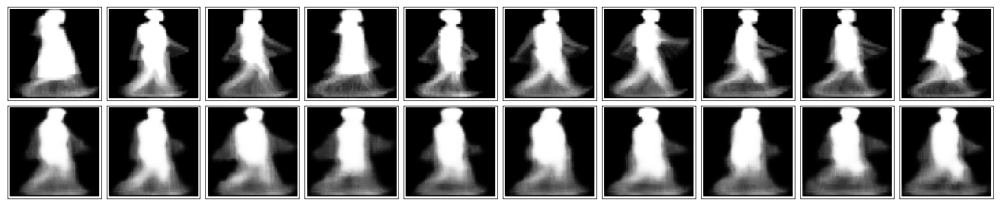

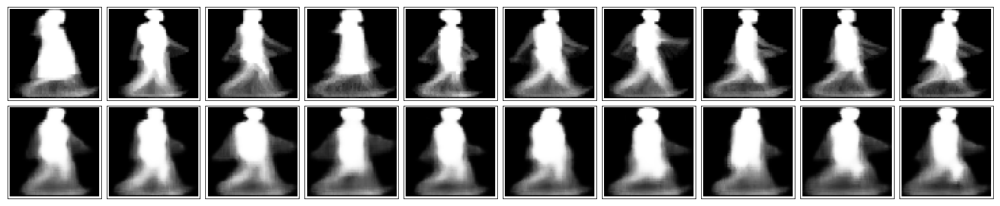

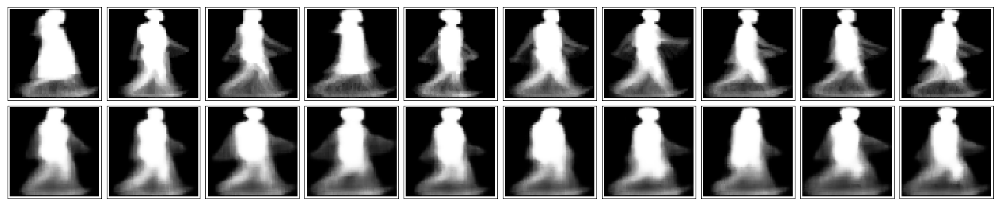

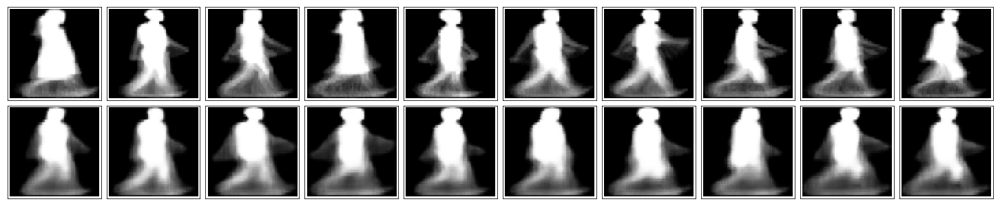

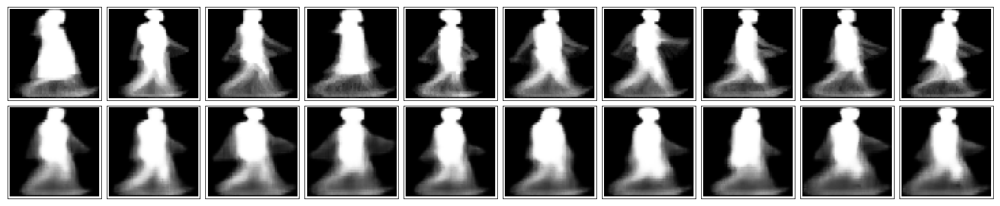

...

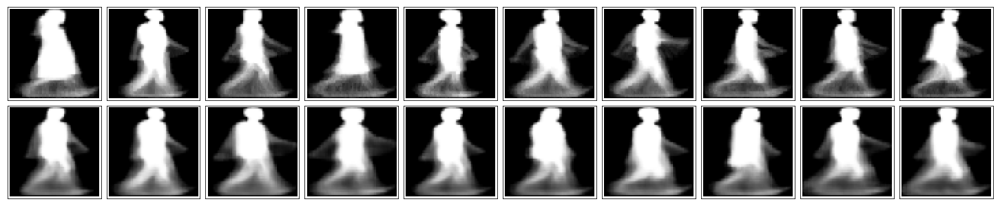

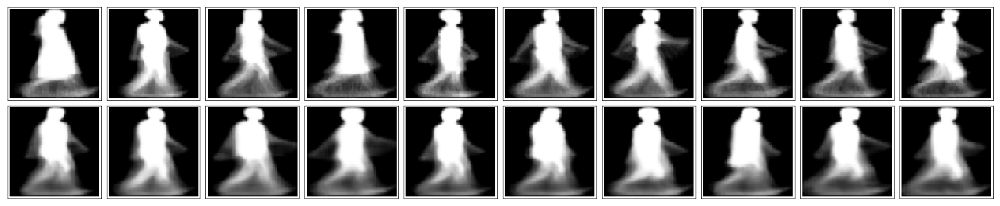

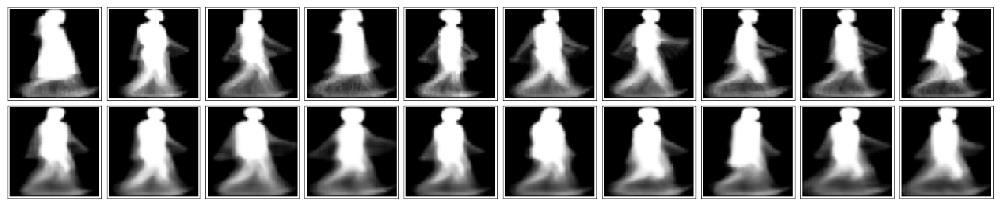

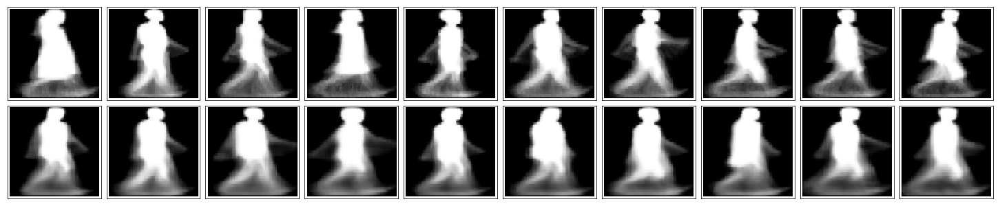

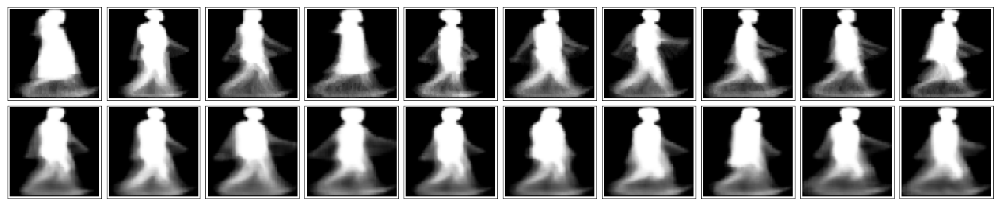

In [11]:
!mkdir checkpoints_view_invariant

training = True
num_layers = 3
epochs = 800
batch_size = 80
conv_kern_size = (3,3)
conv_strides = (1,1)
pool_size = (2,2)
pool_strides = (2,2)
up_size = [(16,16), (32,32), (64,64)]
de_kern_size = (3,3)
de_conv_strides = (1,1)
out_kern_size = (3,3)
out_strides = (1,1)

for lr in [0.001]:
#                 log_string = 'logs/4/lr={},nl={},ls={},bs={}'.format(lr, num_layers, lstm_size, batch_size)
    save_string = './checkpoints_view_invariant/lr={}_nl={}_bs={}.ckpt'.format(lr, num_layers, batch_size)
                
#             writer = tf.summary.FileWriter(log_string)
                                
    model = build_graph(conv_kern_size, conv_strides, pool_size, pool_strides, de_kern_size, de_conv_strides,
                        out_kern_size, out_strides, up_size=up_size, is_training=training)

    train(model, epochs, save_string)
                
    print(' ')
    print(' ')
    print("leraning_rate={},num_layers={},batch_size={} finished, saved".format(lr, num_layers, batch_size))
    print(' ')
    print(' ')

<br><br><br><br><br><br><br><br><br>

## Network Architecture

The encoder part of the network will be a typical convolutional pyramid. Each convolutional layer will be followed by a max-pooling layer to reduce the dimensions of the layers. The decoder though might be something new to you. The decoder needs to convert from a narrow representation to a wide reconstructed image. For example, the representation could be a 4x4x8 max-pool layer. This is the output of the encoder, but also the input to the decoder. We want to get a 28x28x1 image out from the decoder so we need to work our way back up from the narrow decoder input layer. A schematic of the network is shown below.

<img src='assets/convolutional_autoencoder.png' width=500px>

Here our final encoder layer has size 4x4x8 = 128. The original images have size 28x28 = 784, so the encoded vector is roughly 16% the size of the original image. These are just suggested sizes for each of the layers. Feel free to change the depths and sizes, but remember our goal here is to find a small representation of the input data.

### What's going on with the decoder

Okay, so the decoder has these "Upsample" layers that you might not have seen before. First off, I'll discuss a bit what these layers *aren't*. Usually, you'll see **transposed convolution** layers used to increase the width and height of the layers. They work almost exactly the same as convolutional layers, but in reverse. A stride in the input layer results in a larger stride in the transposed convolution layer. For example, if you have a 3x3 kernel, a 3x3 patch in the input layer will be reduced to one unit in a convolutional layer. Comparatively, one unit in the input layer will be expanded to a 3x3 path in a transposed convolution layer. The TensorFlow API provides us with an easy way to create the layers, [`tf.nn.conv2d_transpose`](https://www.tensorflow.org/api_docs/python/tf/nn/conv2d_transpose). 

However, transposed convolution layers can lead to artifacts in the final images, such as checkerboard patterns. This is due to overlap in the kernels which can be avoided by setting the stride and kernel size equal. In [this Distill article](http://distill.pub/2016/deconv-checkerboard/) from Augustus Odena, *et al*, the authors show that these checkerboard artifacts can be avoided by resizing the layers using nearest neighbor or bilinear interpolation (upsampling) followed by a convolutional layer. In TensorFlow, this is easily done with [`tf.image.resize_images`](https://www.tensorflow.org/versions/r1.1/api_docs/python/tf/image/resize_images), followed by a convolution. Be sure to read the Distill article to get a better understanding of deconvolutional layers and why we're using upsampling.

> **Exercise:** Build the network shown above. Remember that a convolutional layer with strides of 1 and 'same' padding won't reduce the height and width. That is, if the input is 28x28 and the convolution layer has stride = 1 and 'same' padding, the convolutional layer will also be 28x28. The max-pool layers are used the reduce the width and height. A stride of 2 will reduce the size by 2. Odena *et al* claim that nearest neighbor interpolation works best for the upsampling, so make sure to include that as a parameter in `tf.image.resize_images` or use [`tf.image.resize_nearest_neighbor`]( `https://www.tensorflow.org/api_docs/python/tf/image/resize_nearest_neighbor). For convolutional layers, use [`tf.layers.conv2d`](https://www.tensorflow.org/api_docs/python/tf/layers/conv2d). For example, you would write `conv1 = tf.layers.conv2d(inputs, 32, (5,5), padding='same', activation=tf.nn.relu)` for a layer with a depth of 32, a 5x5 kernel, stride of (1,1), padding is 'same', and a ReLU activation. Similarly, for the max-pool layers, use [`tf.layers.max_pooling2d`](https://www.tensorflow.org/api_docs/python/tf/layers/max_pooling2d).

## Training

As before, here wi'll train the network. Instead of flattening the images though, we can pass them in as 28x28x1 arrays.

In [6]:
sess = tf.Session()

In [ ]:
epochs = 20
batch_size = 200
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        imgs = batch[0].reshape((-1, 28, 28, 1))
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

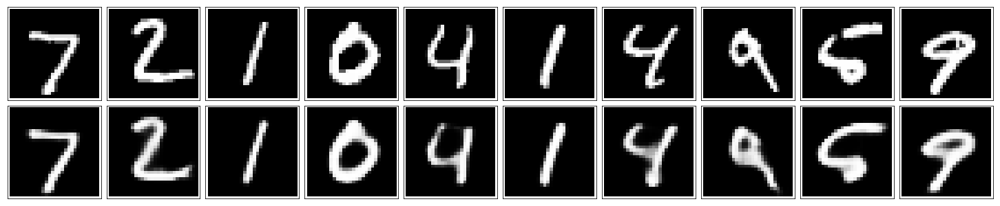

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
reconstructed = sess.run(decoded, feed_dict={inputs_: in_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([in_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


fig.tight_layout(pad=0.1)

In [19]:
sess.close()

## Denoising

As I've mentioned before, autoencoders like the ones you've built so far aren't too useful in practive. However, they can be used to denoise images quite successfully just by training the network on noisy images. We can create the noisy images ourselves by adding Gaussian noise to the training images, then clipping the values to be between 0 and 1. We'll use noisy images as input and the original, clean images as targets. Here's an example of the noisy images I generated and the denoised images.

![Denoising autoencoder](assets/denoising.png)


Since this is a harder problem for the network, we'll want to use deeper convolutional layers here, more feature maps. I suggest something like 32-32-16 for the depths of the convolutional layers in the encoder, and the same depths going backward through the decoder. Otherwise the architecture is the same as before.

> **Exercise:** Build the network for the denoising autoencoder. It's the same as before, but with deeper layers. I suggest 32-32-16 for the depths, but you can play with these numbers, or add more layers.

In [21]:
inputs_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='inputs')
targets_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='targets')

### Encoder
conv1 = tf.layers.conv2d(inputs_, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32
maxpool1 = tf.layers.max_pooling2d(conv1, (2,2), (2,2), padding='same')
# Now 14x14x32
conv2 = tf.layers.conv2d(maxpool1, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
# Now 7x7x32
conv3 = tf.layers.conv2d(maxpool2, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
# Now 4x4x16

### Decoder
upsample1 = tf.image.resize_nearest_neighbor(encoded, (7,7))
# Now 7x7x16
conv4 = tf.layers.conv2d(upsample1, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
# Now 14x14x16
conv5 = tf.layers.conv2d(upsample2, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
# Now 28x28x32
conv6 = tf.layers.conv2d(upsample3, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32

logits = tf.layers.conv2d(conv6, 1, (3,3), padding='same', activation=None)
#Now 28x28x1

decoded = tf.nn.sigmoid(logits, name='decoded')

loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_, logits=logits)
cost = tf.reduce_mean(loss)
opt = tf.train.AdamOptimizer(0.001).minimize(cost)

In [22]:
sess = tf.Session()

In [ ]:
epochs = 100
batch_size = 200
# Set's how much noise we're adding to the MNIST images
noise_factor = 0.5
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        # Get images from the batch
        imgs = batch[0].reshape((-1, 28, 28, 1))
        
        # Add random noise to the input images
        noisy_imgs = imgs + noise_factor * np.random.randn(*imgs.shape)
        # Clip the images to be between 0 and 1
        noisy_imgs = np.clip(noisy_imgs, 0., 1.)
        
        # Noisy images as inputs, original images as targets
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: noisy_imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

## Checking out the performance

Here I'm adding noise to the test images and passing them through the autoencoder. It does a suprising great job of removing the noise, even though it's sometimes difficult to tell what the original number is.

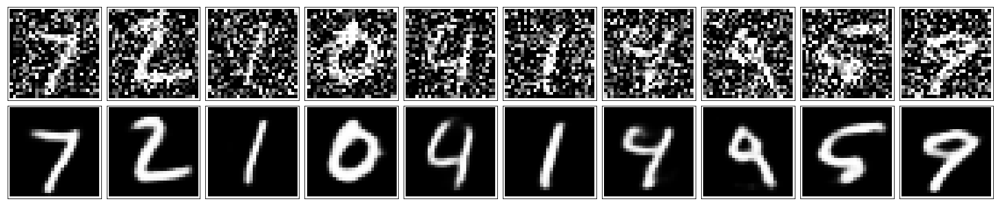

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
noisy_imgs = in_imgs + noise_factor * np.random.randn(*in_imgs.shape)
noisy_imgs = np.clip(noisy_imgs, 0., 1.)

reconstructed = sess.run(decoded, feed_dict={inputs_: noisy_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([noisy_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

fig.tight_layout(pad=0.1)